In [2]:
import mne
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

Constatns

In [3]:
fs = 128
pre_stimul_offset = 0.2
post_stimul_offset = 1
emotiv_montage_path = 'EPOCX_emotiv_montage.locs'
data_folder = 'data'
erp_images_folder = 'erp_images'
cropped_erp_images_folder = 'cropped_erp_images'
interval_marker_file_masks = ['_Восприятие инфоповодов_intervalMarker.csv', '_Восприятие инфоповодов__intervalMarker.csv']
experiment_data_file_masks = ['_Восприятие инфоповодов_RAW.csv', '_Восприятие инфоповодов.csv']
stimulus_names = ["VK_JAPAN_INFO", "VK_JAPAN_COM", "VK_JAPAN_THR", "TG_JAPAN_INFO", "TG_JAPAN_COM", "TG_JAPAN_THR", 
                  "TG_MASK_INFO", "TG_MUSK_COM", "TG_MUSK_THR", "VK_MASK_INFO", "VK_MUSK_COM", "VK_MUSK_THR", 
                  "VK_BORISOV_INFO", "VK_BORISOV_COM", "VK_BORISOV_THR", "TG_BORISOV_INFO", "TG_BORISOV_COM", "TG_BORISOV_THR", 
                  "TG_EGE_INFO", "TG_EGE_COM", "TG_EGE_THR_1", "TG_EGE_THR_2",
                  "VK_EGE_INFO", "VK_EGE_COM"]
EEG_cols = ['EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2',
            'EEG.P8',  'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4']
# EEG_cols = [c for c in df.columns if c.startswith('EEG.') and len(c) < 9]

In [4]:
from os import path, makedirs

def get_file_path(folder:str, possible_file_masks:list[str], subject: int) -> str:
    for mask in possible_file_masks:
        file_path = path.join(folder, f"{subject}" + mask)
        if path.isfile(file_path):
            return file_path
    raise FileNotFoundError() 

def create_directory_if_not_exists(directory_path: str) -> None:
    if not path.exists(directory_path):
     makedirs(directory_path)
     
create_directory_if_not_exists(erp_images_folder)
create_directory_if_not_exists(cropped_erp_images_folder)

In [5]:
def slice_by_time(df: pd.DataFrame, colunn_name: str, start_sec: float, end_sec: float) -> pd.DataFrame:
    t = df[colunn_name].values
    mask = (t >= start_sec) & (t < end_sec)
    return df.loc[mask].copy()

## Задание 1

Фильтрация и разметка ЭЭГ данных.

In [6]:
from scipy.signal import butter, filtfilt
from scipy.signal import medfilt
from scipy.signal import detrend

def bandpass_filter(data: pd.Series, lowcut: float=0.1, highcut: float=45, fs: float=128, order: float=4) -> pd.Series:
    nyq = 0.5 * fs
    b, a = butter(order, [lowcut/nyq, highcut/nyq], btype='bandpass')
    return filtfilt(b, a, data)

def median_filter(data: pd.Series, kernel_size: int=3) -> pd.Series:
    return medfilt(data, kernel_size)

def detrend_data(data: pd.Series) -> pd.Series:
    return detrend(data)

In [7]:
def process_raw_eeg(stimulus_df: pd.DataFrame, stimulus_start: float, timestamp_column: str, eeg_cols: list[str]) -> pd.DataFrame:
    df = stimulus_df.copy()
    all_columns = [timestamp_column]
    all_columns.extend(eeg_cols)
    df = df[all_columns]
    df[timestamp_column] = df[timestamp_column] - stimulus_start
    df = df.set_index(timestamp_column)
    
    for column_name in eeg_cols:
        df[column_name] = bandpass_filter(df[column_name]) 
        df[column_name] = median_filter(df[column_name])  
        df[column_name] = detrend_data(df[column_name])
    
    baseline = df.loc[:0]
    df = df - baseline.mean()
    return df

def mark_up_data(raw_df: pd.DataFrame, interval_marker: pd.DataFrame, stimulus_eeg_data: dict[str, list[pd.DataFrame]]) -> None:    
    stimulus_itervals = interval_marker[interval_marker['type'].isin(stimulus_names)]
    for stimulus_start, duration, stimulus_type in zip(stimulus_itervals['timestamp'], stimulus_itervals['duration'], stimulus_itervals['type']):    
        window_start = stimulus_start - pre_stimul_offset
        window_end = stimulus_start + duration + post_stimul_offset
        stimulus_df = slice_by_time(raw_df, "Timestamp", window_start, window_end)
        stimulus_df = process_raw_eeg(stimulus_df, stimulus_start, "Timestamp", EEG_cols)    
        if stimulus_type not in stimulus_eeg_data:
            stimulus_eeg_data[stimulus_type] = []
        stimulus_eeg_data[stimulus_type].append(stimulus_df)

Выделение из сырых данных кусков, соответсвующих стимулам.

In [8]:
import tqdm
stimulus_eeg_data = {}
for subject_num in tqdm.tqdm(range(1, 17)):
    raw_file_path = get_file_path(data_folder, experiment_data_file_masks, subject_num)
    intervals_file_path = get_file_path(data_folder, interval_marker_file_masks, subject_num)
    raw_df = pd.read_csv(raw_file_path, skiprows=1, sep=',')
    interval_marker = pd.read_csv(intervals_file_path, sep=',')
    mark_up_data(raw_df, interval_marker, stimulus_eeg_data)
    

100%|██████████| 16/16 [01:07<00:00,  4.21s/it]


Отдельно обработка пилотных данных

In [9]:
data_path = path.join(data_folder, '0_Восприятие_инфоповодов_basic_pre_processing.csv')
fixed_data_path = path.join(data_folder, 'fixed_0_Восприятие_инфоповодов_basic_pre_processing.csv')
eeg_cols = [column_name.lower() for column_name in EEG_cols]

In [10]:
with open(data_path, "r", encoding="utf-8") as fin, open(fixed_data_path, "w", encoding="utf-8") as fout:
    for line in fin:
        line = line.replace('""', "''")
        line = line.replace('"', '')
        line = line.replace("''", '"')
        fout.write(line)

pilot_df = pd.read_csv(fixed_data_path, sep=',', low_memory=False)

In [11]:
pilot_df['marker_type'] = (
    pilot_df['marker_label__desc'].dropna().apply(lambda x: x.split(',')[-1].strip())
)

In [12]:
rename_dict = {key: value for key, value in zip(eeg_cols, EEG_cols)}
rename_dict['timestamp'] = 'Timestamp'
pilot_df = pilot_df.rename(columns=rename_dict)

In [13]:
pre_offset = int(fs * pre_stimul_offset)
post_offset = int(fs * post_stimul_offset)
for stimulus_type in tqdm.tqdm(stimulus_names): 
    mask = pilot_df["marker_type"].astype(str).str.contains(stimulus_type, na=False)
    first_row = pilot_df[mask].head(1)
    last_row = pilot_df[mask].tail(1)
    start = int(first_row.index[0] - pre_offset)
    end = int(last_row.index[0] + post_offset)

    stimulus_df = pilot_df.iloc[start:end, :]
    stimulus_df = process_raw_eeg(stimulus_df, first_row['Timestamp'].values[0], 'Timestamp', EEG_cols)    
    if stimulus_type not in stimulus_eeg_data:
        stimulus_eeg_data[stimulus_type] = []
    stimulus_eeg_data[stimulus_type].append(stimulus_df)

100%|██████████| 24/24 [00:03<00:00,  7.18it/s]


Для каждого типа стимула, усреднение и рассчёт ERP.

In [14]:
def average_dataframes(dfs: list[pd.DataFrame]) -> pd.DataFrame:
    ref_index = dfs[0].index
    dfs_interp = [df.reindex(ref_index).interpolate(method='linear', axis=0, limit_direction='both') for df in dfs]
    arrays = np.stack([df.values for df in dfs_interp])
    erp = pd.DataFrame(arrays.mean(axis=0), columns=dfs[0].columns, index=ref_index)
    return erp

In [15]:
from matplotlib.cm import tab20c
import matplotlib.ticker as ticker

def load_montage(montage_path: str) -> mne.channels.DigMontage:
    montage = mne.channels.read_custom_montage(montage_path)
    return montage

def plot_montage(montage: mne.channels.DigMontage, ax: plt.Axes, colors: list[str], EEG_channel_names: list[str]) -> None:
    pos = montage.get_positions()['ch_pos']
    xy = np.array([pos[ch][:2] for ch in EEG_channel_names])
    x = xy[:, 0]
    y = xy[:, 1]
    
    ax.scatter(x, y, s=70, c=colors, edgecolor='k', linewidth=1.5)
    ax.axis('equal')
    ax.axis('off')
    info = mne.create_info(EEG_channel_names, fs, ch_types='eeg')
    info.set_montage(montage)
    mne.viz.plot_sensors(info, show_names=False, show=False, pointsize=0, axes=ax)

def plot_and_save_erp(erp: pd.DataFrame, images_folder: str, stimulus_name: str, montage: mne.channels.DigMontage, EEG_cols: list[str]) -> None:
    times = erp.index
    data = erp[EEG_cols].T.values
    EEG_channel_names = [column_name.split("EEG.")[1] for column_name in EEG_cols]
    colors = tab20c(range(len(EEG_channel_names)))
    fig = plt.figure(figsize=(12, 6))
    gs = fig.add_gridspec(1, 2, width_ratios=[7, 1])

    ax1 = fig.add_subplot(gs[0])
    
    for i, ch in enumerate(EEG_channel_names):
        ax1.plot(times, data[i, :], color=colors[i], label=ch, linewidth=1.5)
    ax1.set_title(f"ERP по всем каналам. {stimulus_name}", fontsize=14)
    ax1.set_xlabel("Время (с)")
    ax1.set_ylabel("Амплитуда (мкВ)")

    ax1.xaxis.set_major_locator(ticker.MultipleLocator(0.5))
    ax1.xaxis.set_minor_locator(ticker.MultipleLocator(0.1))
    ax1.grid(True, alpha=0.3)
    ax1.grid(which='minor', color='gray', linestyle=':', linewidth=0.2, alpha=0.3)
    ax2 = fig.add_subplot(gs[1])
    plot_montage(montage, ax2, colors, EEG_channel_names)
    plt.tight_layout()
    plt.savefig(path.join(images_folder, stimulus_name + '.png'))
    # plt.show()
    

Отрисовка графиков по разным стимулам. Отдельно, сохраняю так же обрезанные на интервале [-0.2, 0.5] секунд, на них лучше видно первую реакцию испытуемого.

  0%|          | 0/24 [00:00<?, ?it/s]

 42%|████▏     | 10/24 [00:21<00:27,  1.95s/it]C:\Users\Ivan_\AppData\Local\Temp\ipykernel_17516\1925292798.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12, 6))
100%|██████████| 24/24 [00:49<00:00,  2.04s/it]


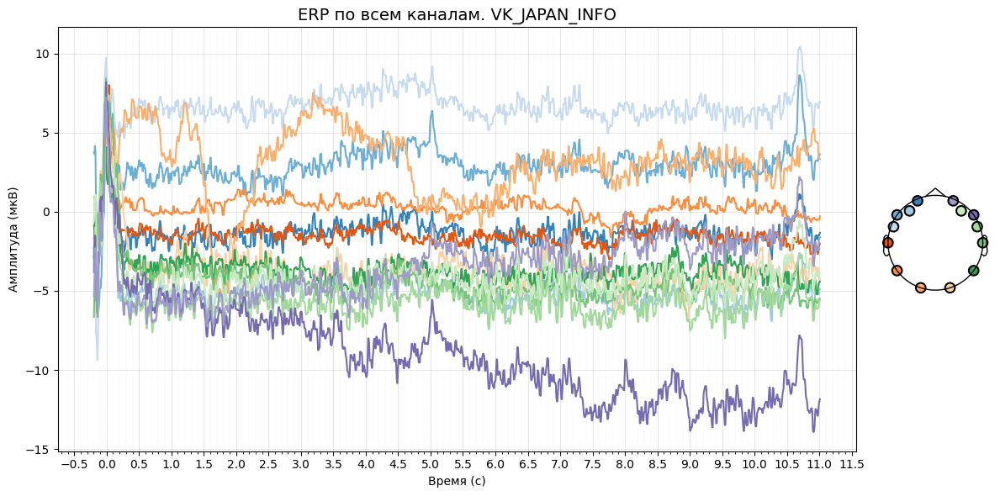

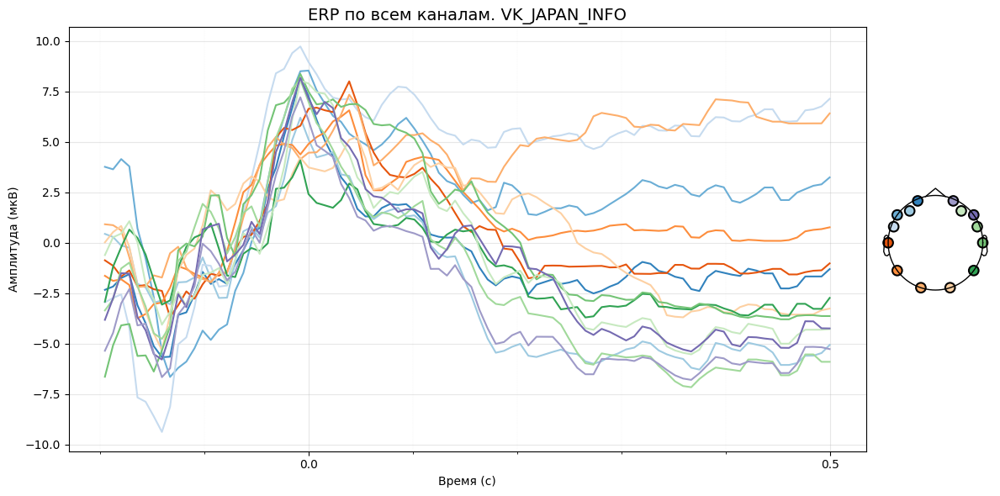

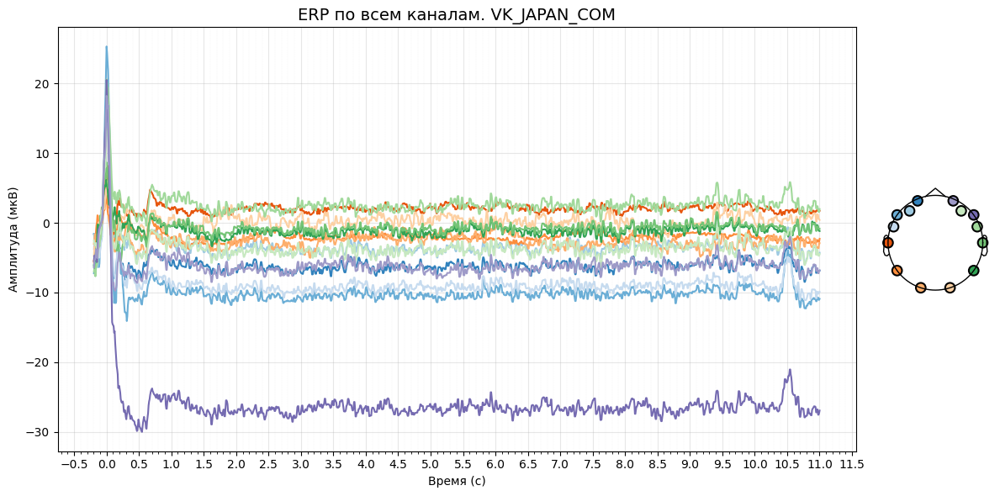

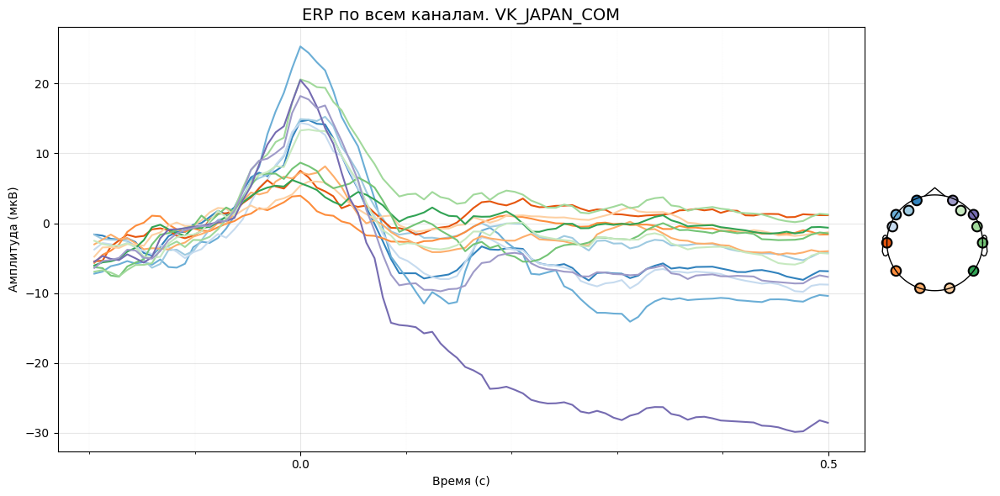

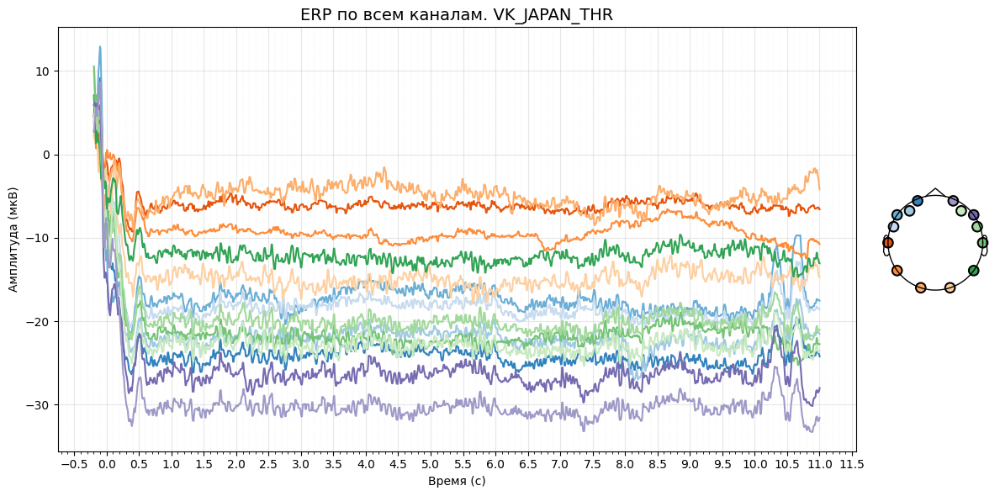

...

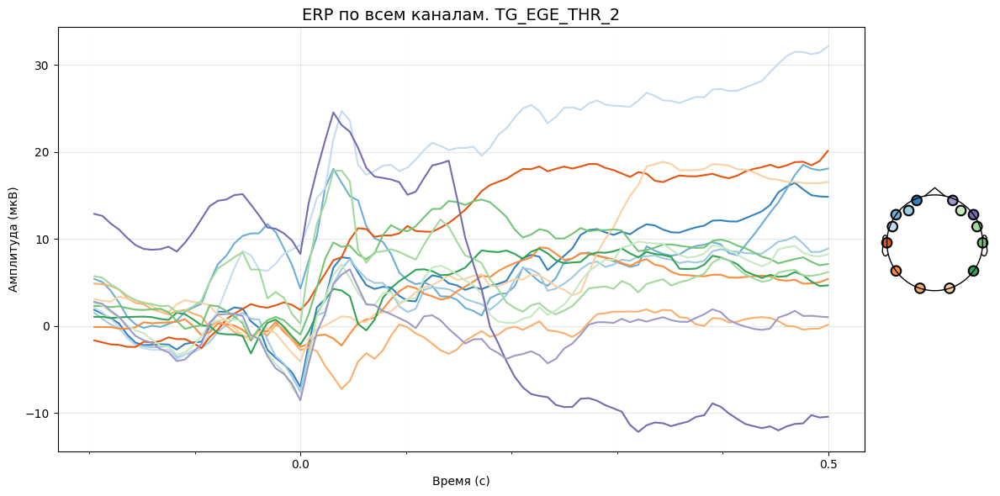

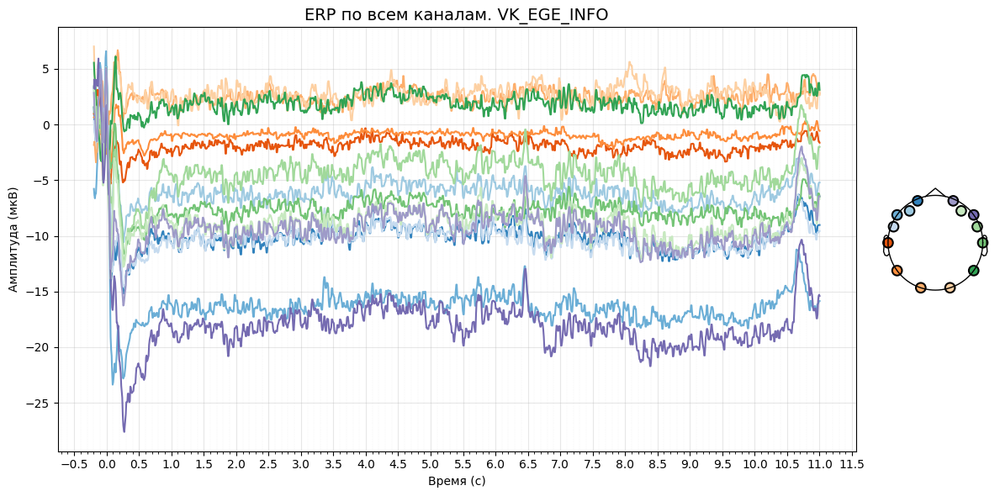

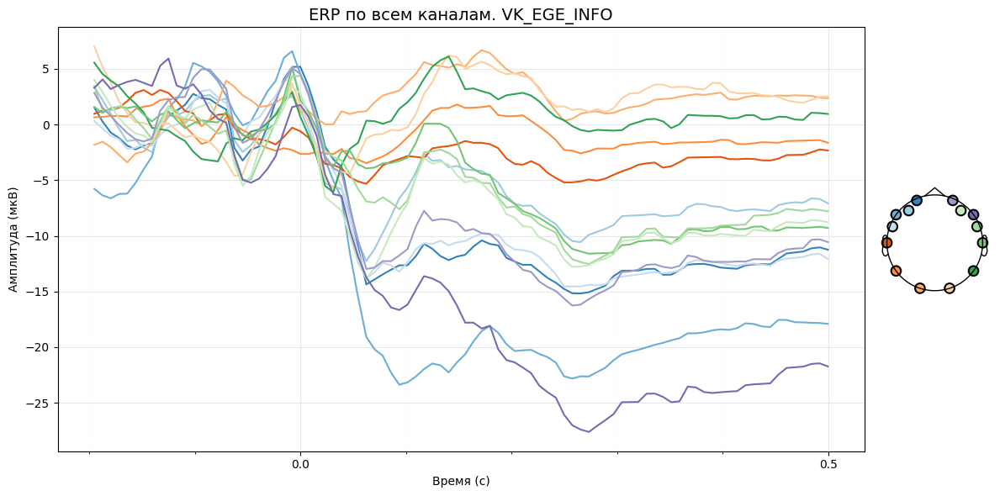

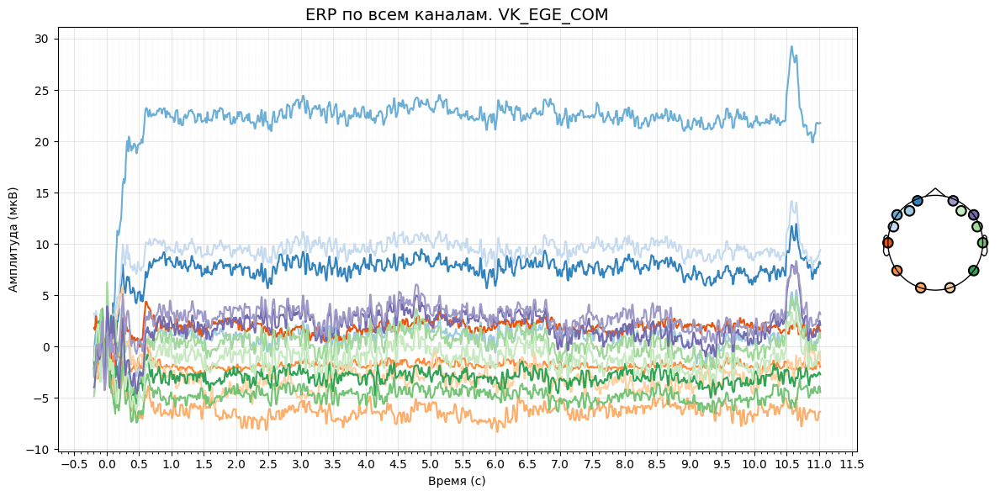

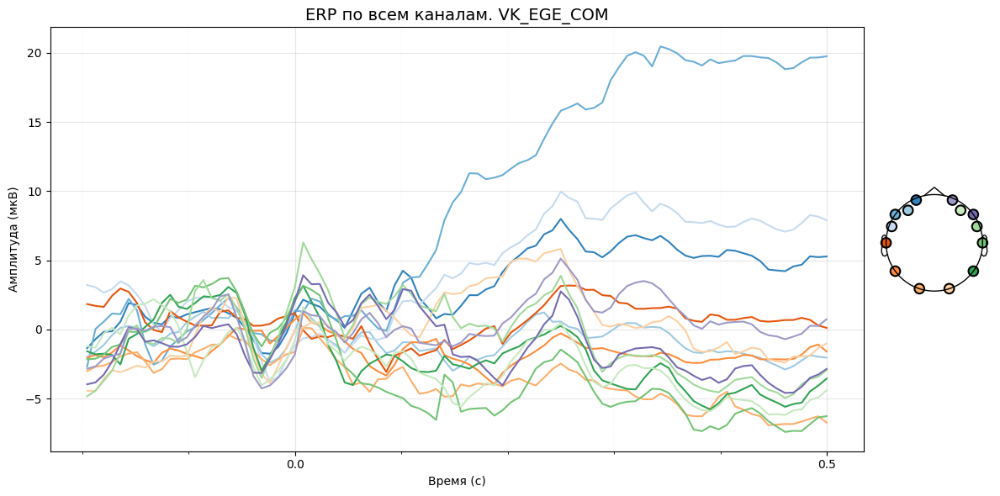

In [16]:
montage = load_montage(emotiv_montage_path)

for stimulus_name in tqdm.tqdm(stimulus_eeg_data):
    erp = average_dataframes(stimulus_eeg_data[stimulus_name])
    plot_and_save_erp(erp, erp_images_folder, stimulus_name, montage, EEG_cols)
    cropped_erp = erp.loc[-0.2:0.5]
    plot_and_save_erp(cropped_erp, cropped_erp_images_folder, stimulus_name, montage, EEG_cols)
    

# Задание 2

In [17]:
raw_data_file_masks = ["_RAW DATA.csv"]
emotions_folder = 'emotions_images'
create_directory_if_not_exists(emotions_folder)

In [34]:
raw_file_path = get_file_path(data_folder, raw_data_file_masks, 1)
intervals_file_path = get_file_path(data_folder, interval_marker_file_masks, 1)
raw_df = pd.read_csv(raw_file_path, skiprows=1, sep=';')
emotion_columns = [column for column in raw_df if column.startswith('PM.') and column.endswith('.Scaled')]

In [35]:
emotion_columns

['PM.Attention.Scaled',
 'PM.Engagement.Scaled',
 'PM.Excitement.Scaled',
 'PM.Stress.Scaled',
 'PM.Relaxation.Scaled',
 'PM.Interest.Scaled',
 'PM.Focus.Scaled']

In [36]:
def process_emotions(stimulus_df: pd.DataFrame, stimulus_start: float, timestamp_column: str, emotion_columns: list[str]) -> pd.DataFrame:
    df = stimulus_df.copy()
    all_columns = [timestamp_column]
    all_columns.extend(emotion_columns)
    df = df[all_columns]
    df[timestamp_column] = df[timestamp_column] - stimulus_start
    df = df.set_index(timestamp_column) 
    baseline = df.loc[:0]
    df = df - baseline.mean()
    return df

def mark_up_emotions_data(raw_df: pd.DataFrame, interval_marker: pd.DataFrame, stimulus_emotion_data: dict[str, list[pd.DataFrame]]) -> None:    
    stimulus_itervals = interval_marker[interval_marker['type'].isin(stimulus_names)]
    for stimulus_start, duration, stimulus_type in zip(stimulus_itervals['timestamp'], stimulus_itervals['duration'], stimulus_itervals['type']):    
        window_start = stimulus_start - pre_stimul_offset
        window_end = stimulus_start + duration + post_stimul_offset
        stimulus_df = slice_by_time(raw_df, "Timestamp", window_start, window_end)
        stimulus_df = process_emotions(stimulus_df, stimulus_start, "Timestamp", emotion_columns)    
        if stimulus_type not in stimulus_emotion_data:
            stimulus_emotion_data[stimulus_type] = []
        stimulus_emotion_data[stimulus_type].append(stimulus_df)

In [37]:
import csv

def guess_separator(file_path: str) -> str:
    with open(file_path, "r", encoding="utf-8") as f:
        sample = f.readline()
        dialect = csv.Sniffer().sniff(sample)
        sep = dialect.delimiter
        return sep

In [38]:
def interpolate_dataframes(dfs: list[pd.DataFrame]) -> pd.DataFrame:
    ref_index = dfs[0].index
    dfs_interp = []
    for df in dfs:
        df = df.sort_index()
        # df = df.infer_objects(copy=False)
        df_index = df.index.astype(float)
        interp_data = {}
        for col in df.columns:
            interp_data[col] = np.interp(
                ref_index,
                df_index,
                df[col].values
            )
        df_interp = pd.DataFrame(interp_data, index=ref_index)
        dfs_interp.append(df_interp)
    arrays = np.stack([df.values for df in dfs_interp])
    average = pd.DataFrame(arrays.mean(axis=0), columns=dfs[0].columns, index=ref_index)
    return average

In [39]:
def fill_nan_in_emotions(raw_df: pd.DataFrame, emotion_columns: list[str]) -> pd.DataFrame:
    df = raw_df.copy()
    df[emotion_columns]= raw_df[emotion_columns].interpolate(method='linear')
    return df

stimulus_emotion_data = {}
for subject_num in tqdm.tqdm(range(1, 17)):
    raw_file_path = get_file_path(data_folder, raw_data_file_masks, subject_num)
    separator = guess_separator(raw_file_path)
    intervals_file_path = get_file_path(data_folder, interval_marker_file_masks, subject_num)
    raw_df = pd.read_csv(raw_file_path, skiprows=1, sep=separator)
    raw_df = fill_nan_in_emotions(raw_df, emotion_columns)
    interval_marker = pd.read_csv(intervals_file_path, sep=',')
    mark_up_emotions_data(raw_df, interval_marker, stimulus_emotion_data)

  0%|          | 0/16 [00:00<?, ?it/s]

100%|██████████| 16/16 [01:06<00:00,  4.14s/it]


Обработка пилотных данных

In [40]:
raw_pilot_file_path = get_file_path(data_folder, raw_data_file_masks, 0)
separator = guess_separator(raw_pilot_file_path)
raw_pilot_df = pd.read_csv(raw_pilot_file_path, skiprows=1, sep=separator)
raw_pilot_df = fill_nan_in_emotions(raw_pilot_df, emotion_columns)

In [41]:
for stimulus_type in tqdm.tqdm(stimulus_names): 
    mask = pilot_df["marker_type"].astype(str).str.contains(stimulus_type, na=False)
    first_row = pilot_df[mask].head(1)
    last_row = pilot_df[mask].tail(1)
    stimulus_start = first_row['Timestamp'].values[0]
    duration = last_row['Timestamp'].values[0] - first_row['Timestamp'].values[0]  

    window_start = stimulus_start - pre_stimul_offset
    window_end = stimulus_start + duration + post_stimul_offset
    stimulus_df = slice_by_time(raw_pilot_df, "Timestamp", window_start, window_end)
    stimulus_df = process_emotions(stimulus_df, stimulus_start, "Timestamp", emotion_columns)    
    if stimulus_type not in stimulus_emotion_data:
        stimulus_emotion_data[stimulus_type] = []
    stimulus_emotion_data[stimulus_type].append(stimulus_df)

100%|██████████| 24/24 [00:02<00:00, 10.00it/s]


Построение графиков эмоций для всех испытуемых

In [42]:
from matplotlib.cm import Set2
def plot_and_save_emotions(df: pd.DataFrame, images_folder: str, stimulus_name: str, emotion_columns: list[str]) -> None:
    times = df.index
    data = df[emotion_columns].T.values
    colors = Set2(range(len(emotion_columns)))
    fig = plt.figure(figsize=(12, 6))
    
    for i, ch in enumerate(emotion_columns):
        plt.plot(times, data[i, :], color=colors[i], label=ch.split(sep='.')[1], linewidth=1.5)
    plt.title(f"Эмоциональные метрики. {stimulus_name}", fontsize=14)
    plt.xlabel("Время (с)")
    plt.ylabel("Величина")
    plt.legend()
    
    ax = plt.gca()
    ax.grid(True, alpha=0.3)
    ax.grid(which='minor', color='gray', linestyle=':', linewidth=0.2, alpha=0.3)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(0.5))
    ax.xaxis.set_minor_locator(ticker.MultipleLocator(0.1))
    plt.tight_layout()
    file_name = stimulus_name.replace(':', '')+ '.png'
    print(file_name)
    plt.savefig(path.join(images_folder, file_name))
    plt.show()

  0%|          | 0/24 [00:00<?, ?it/s]

VK_JAPAN_INFO.png


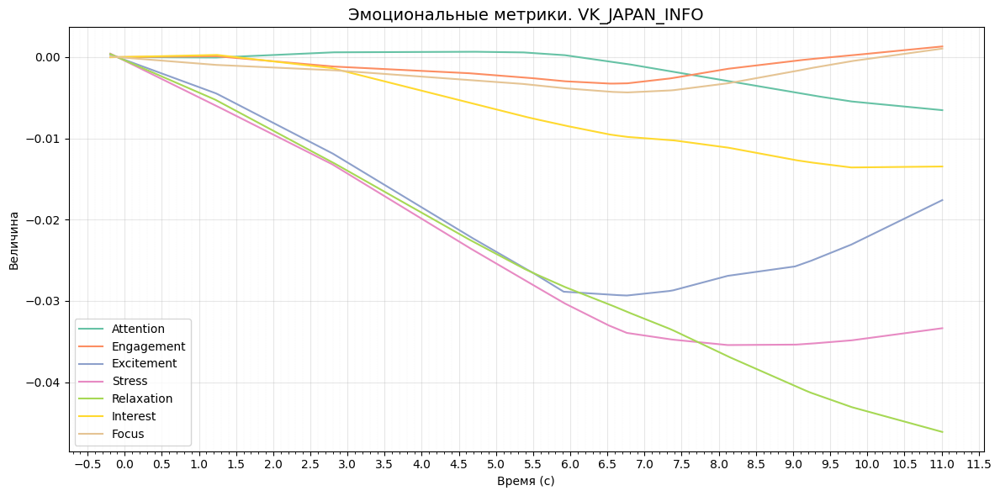

  4%|▍         | 1/24 [00:01<00:36,  1.58s/it]

VK_JAPAN_COM.png


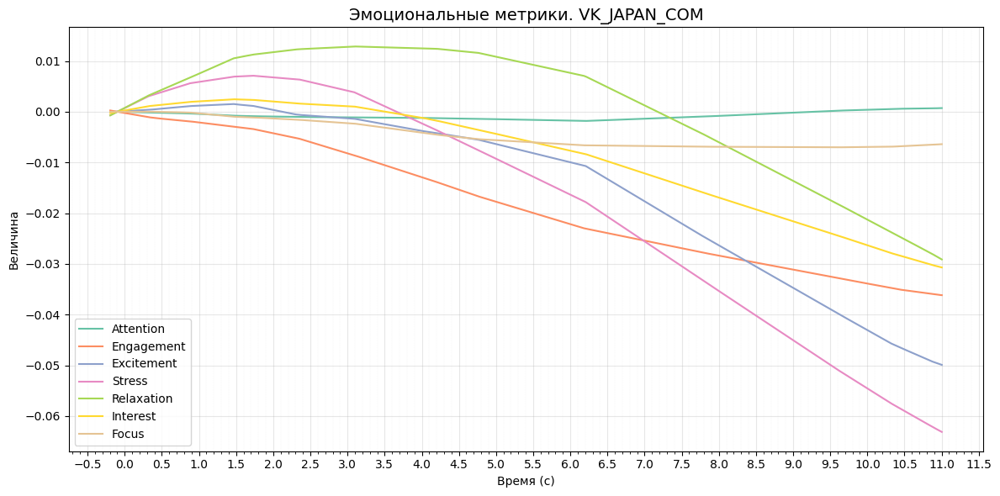

  8%|▊         | 2/24 [00:03<00:35,  1.61s/it]

VK_JAPAN_THR.png


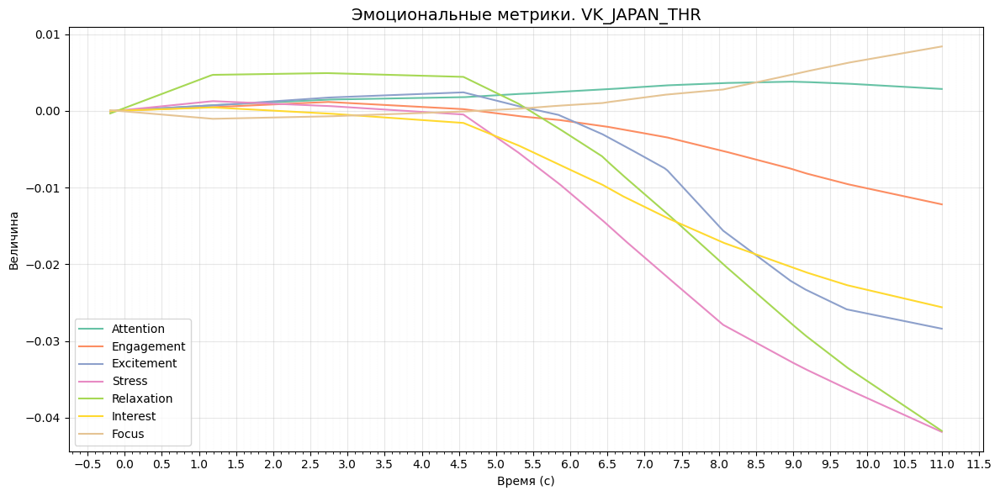

 12%|█▎        | 3/24 [00:04<00:35,  1.68s/it]

TG_JAPAN_INFO.png


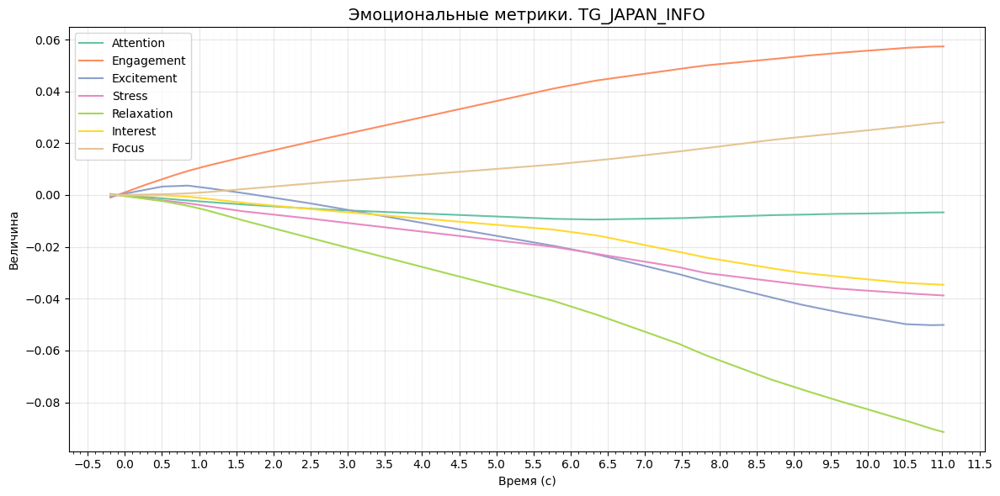

 17%|█▋        | 4/24 [00:06<00:32,  1.61s/it]

TG_JAPAN_COM.png


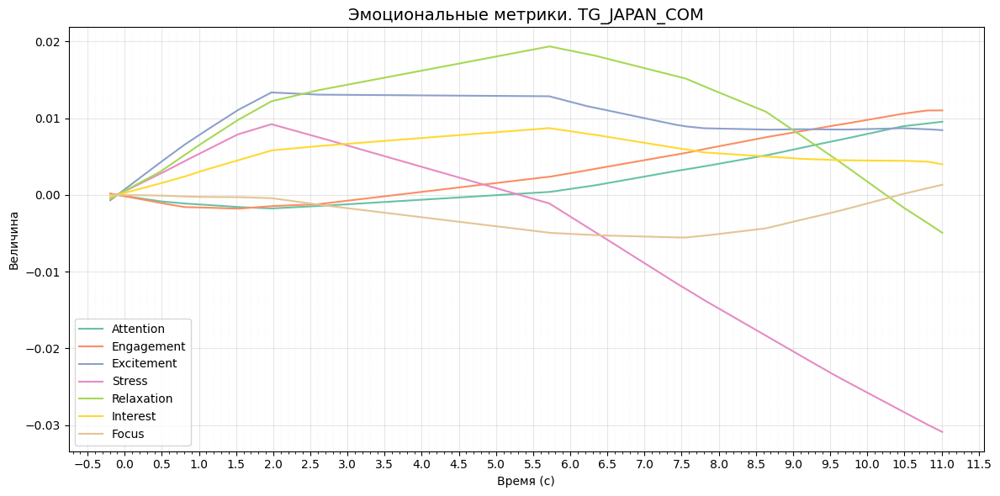

 21%|██        | 5/24 [00:07<00:29,  1.56s/it]

TG_JAPAN_THR.png


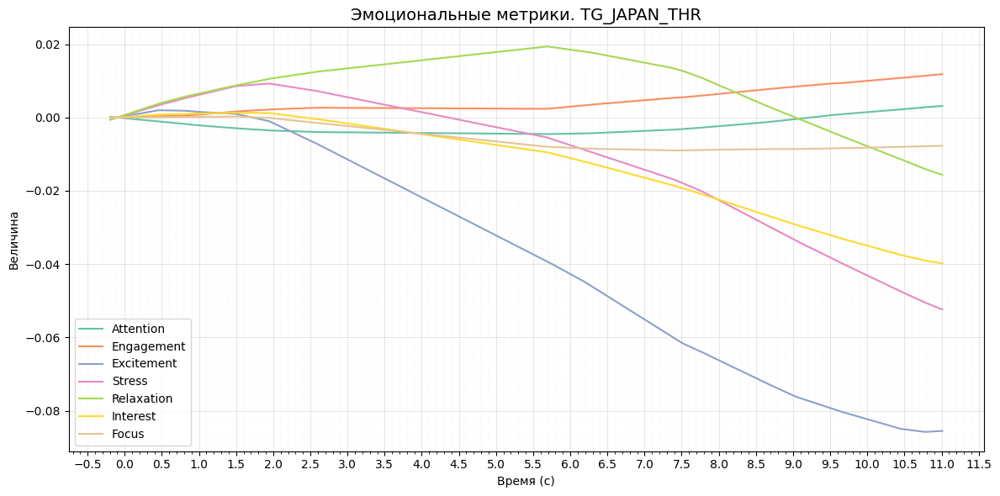

 25%|██▌       | 6/24 [00:09<00:27,  1.53s/it]

TG_MASK_INFO.png


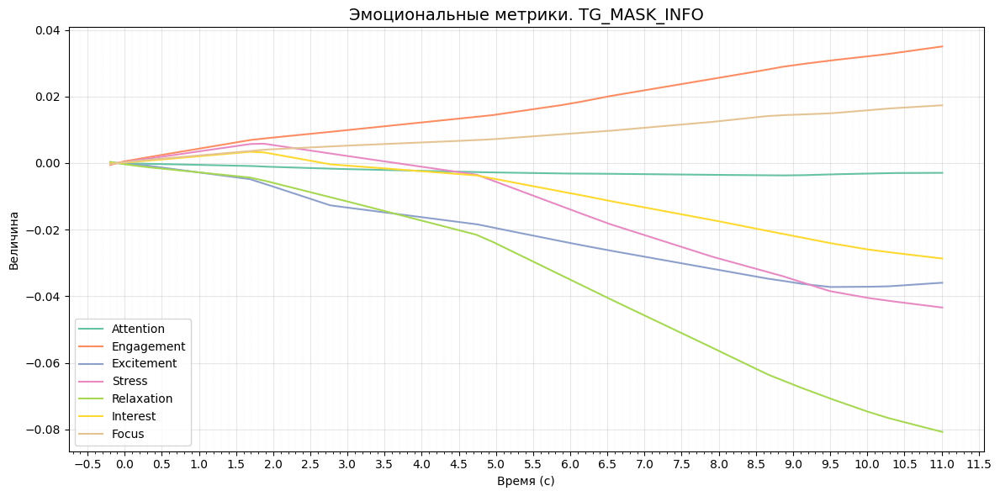

 29%|██▉       | 7/24 [00:11<00:27,  1.61s/it]

TG_MUSK_COM.png


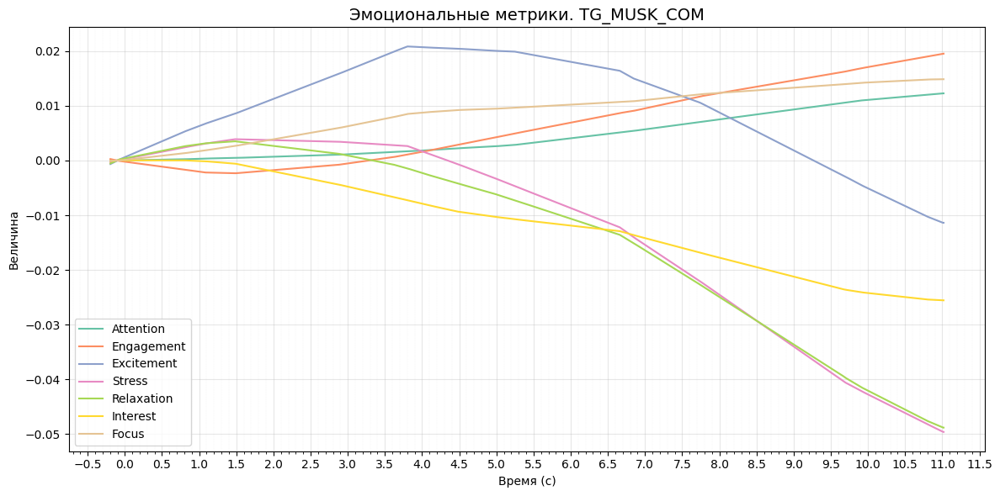

 33%|███▎      | 8/24 [00:12<00:25,  1.58s/it]

TG_MUSK_THR.png


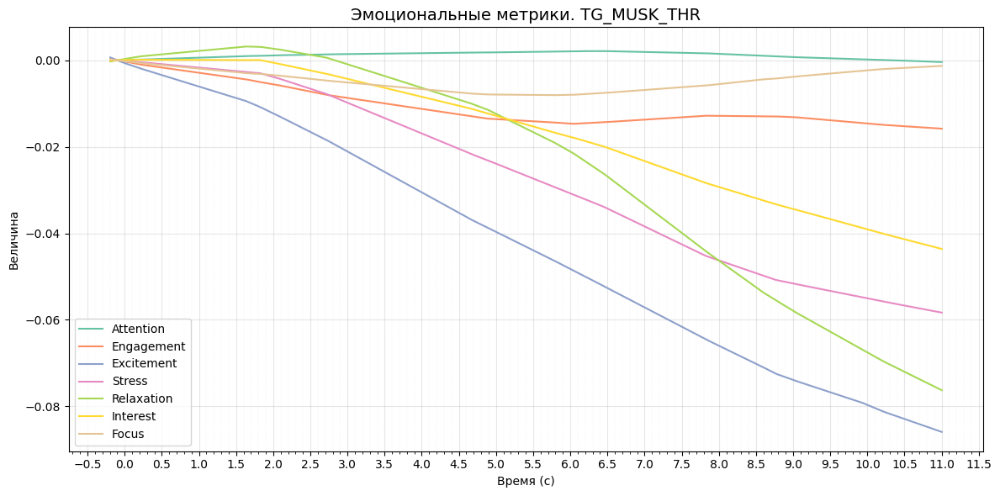

 38%|███▊      | 9/24 [00:14<00:23,  1.57s/it]

VK_MASK_INFO.png


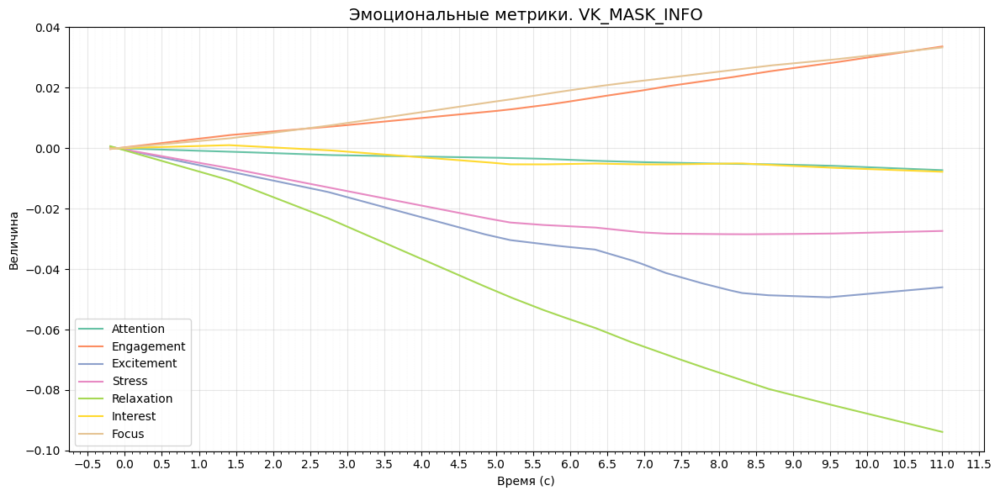

 42%|████▏     | 10/24 [00:15<00:21,  1.51s/it]

VK_MUSK_COM.png


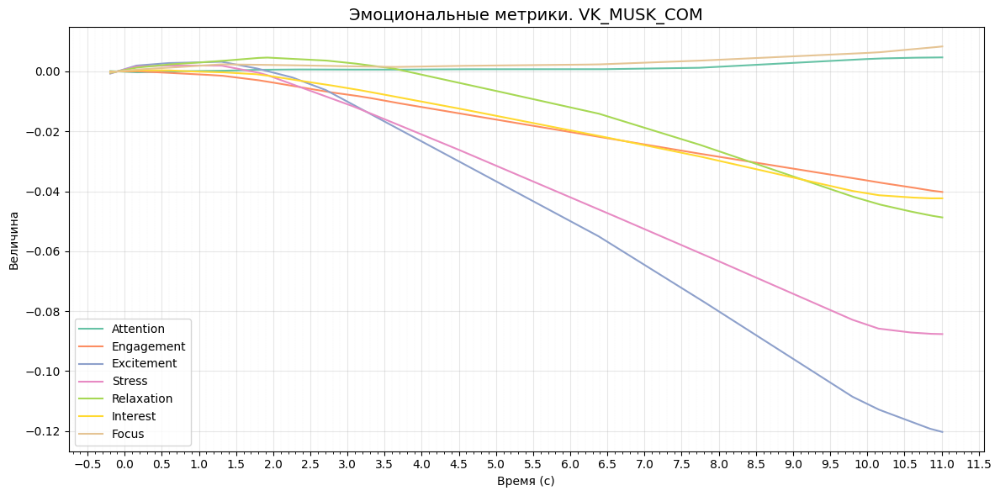

 46%|████▌     | 11/24 [00:17<00:19,  1.47s/it]

VK_MUSK_THR.png


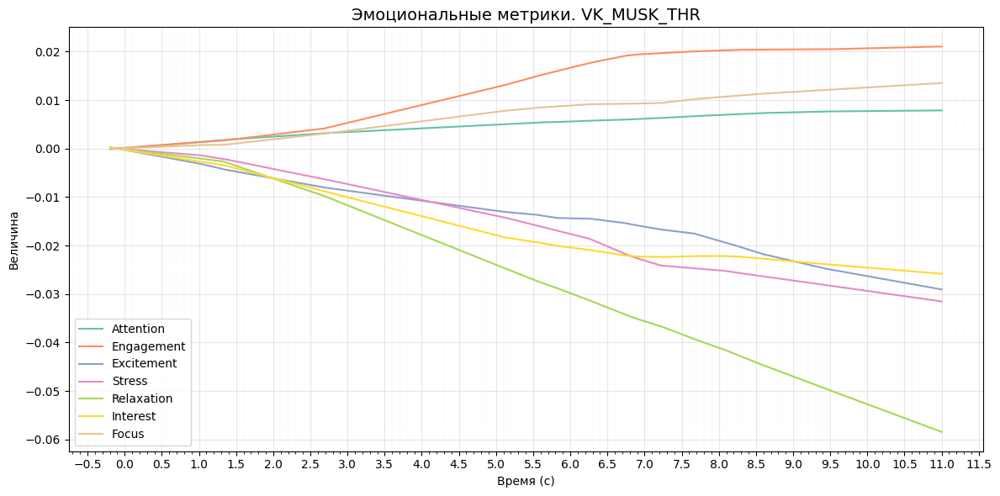

 50%|█████     | 12/24 [00:18<00:18,  1.55s/it]

VK_BORISOV_INFO.png


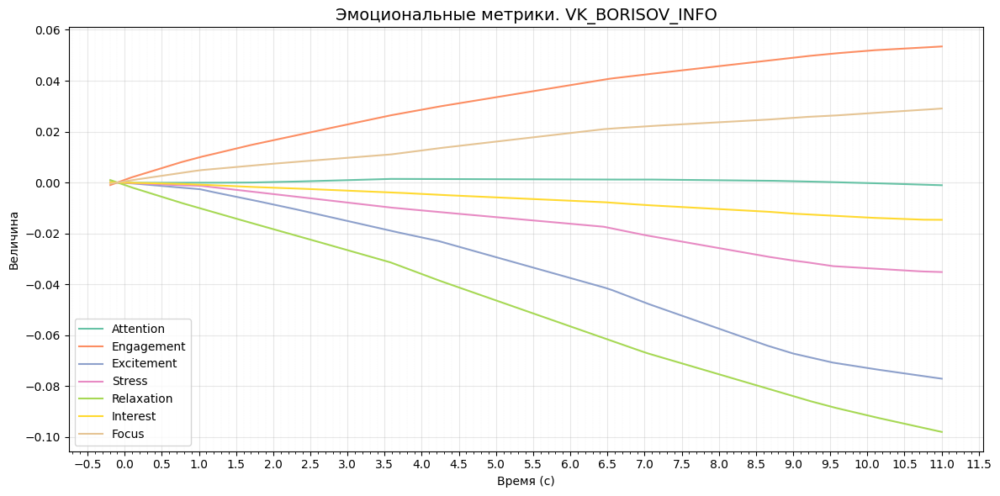

 54%|█████▍    | 13/24 [00:20<00:17,  1.57s/it]

VK_BORISOV_COM.png


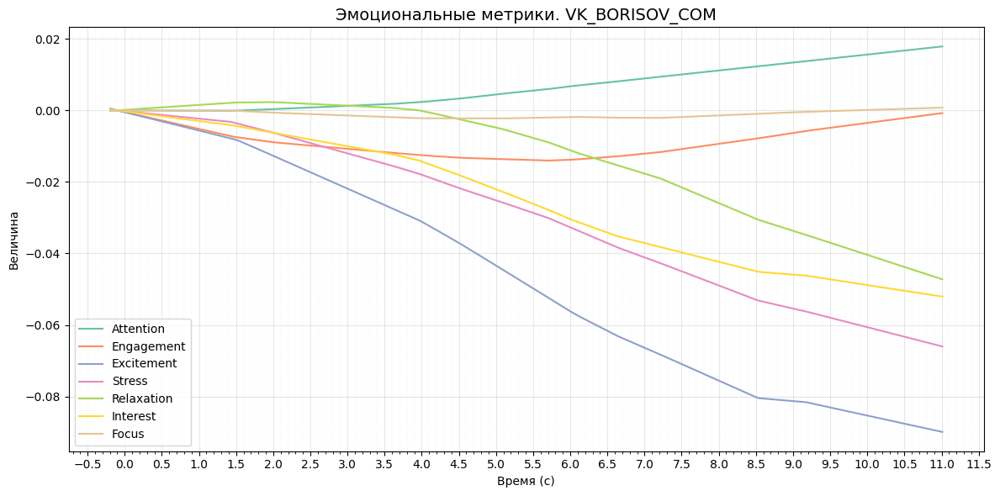

 58%|█████▊    | 14/24 [00:21<00:15,  1.55s/it]

VK_BORISOV_THR.png


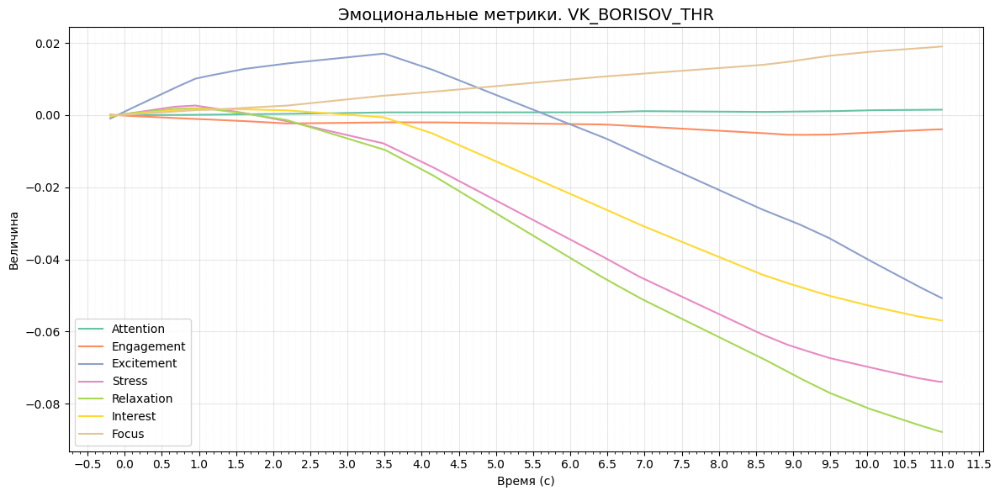

 62%|██████▎   | 15/24 [00:23<00:13,  1.48s/it]

TG_BORISOV_INFO.png


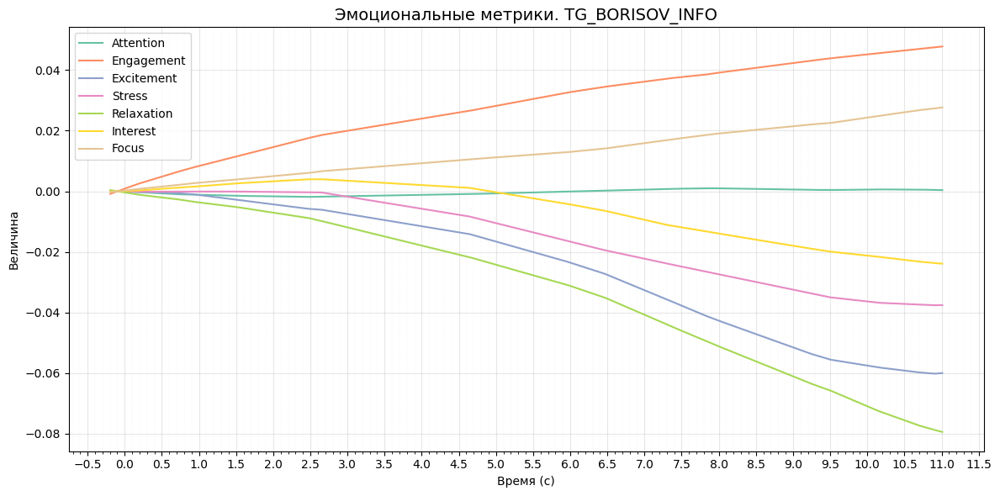

 67%|██████▋   | 16/24 [00:24<00:12,  1.56s/it]

TG_BORISOV_COM.png


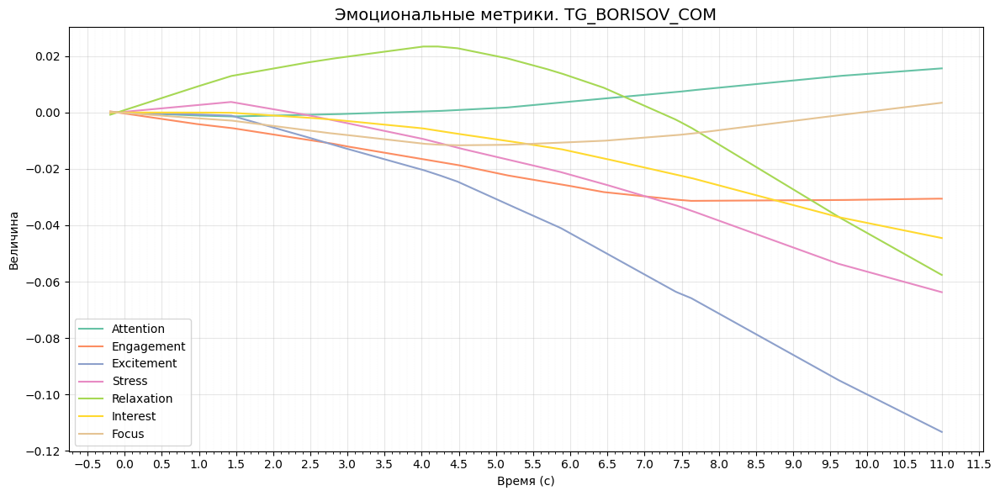

 71%|███████   | 17/24 [00:26<00:10,  1.51s/it]

TG_BORISOV_THR.png


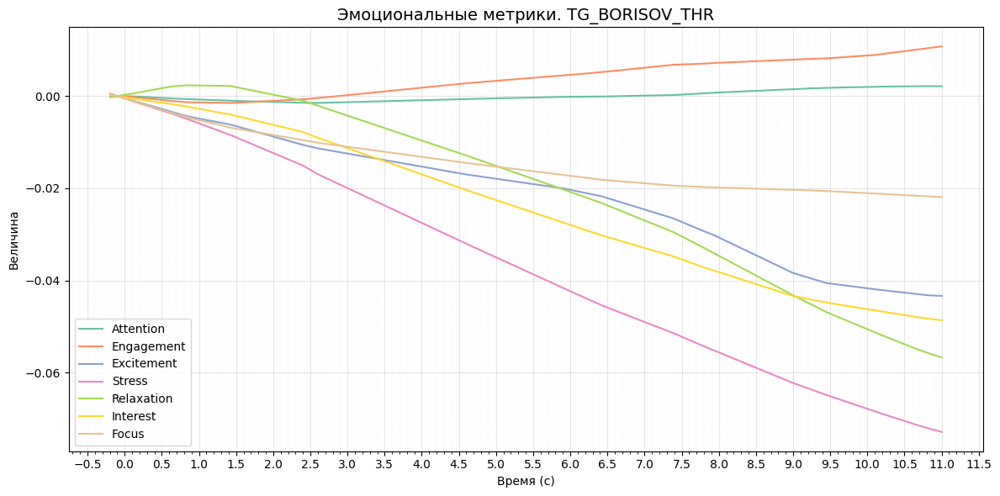

 75%|███████▌  | 18/24 [00:27<00:08,  1.47s/it]

TG_EGE_INFO.png


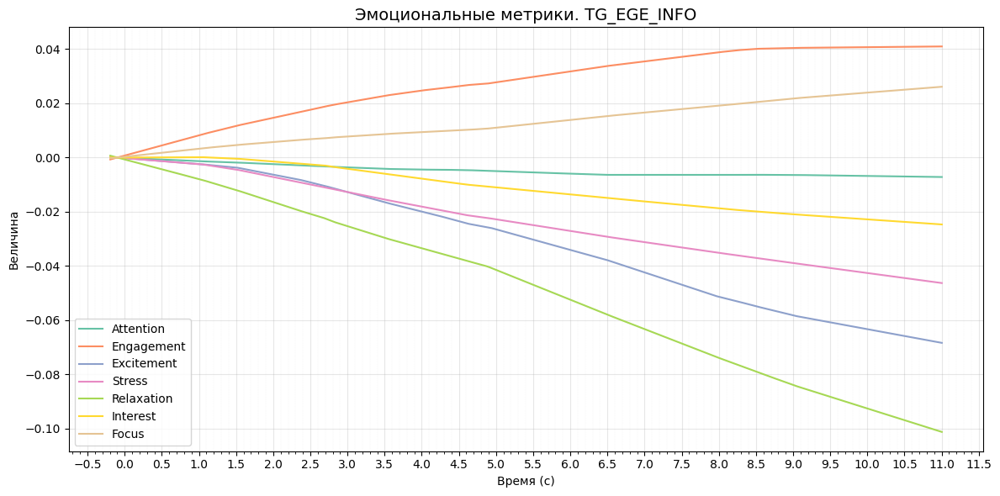

 79%|███████▉  | 19/24 [00:29<00:07,  1.47s/it]

TG_EGE_COM.png


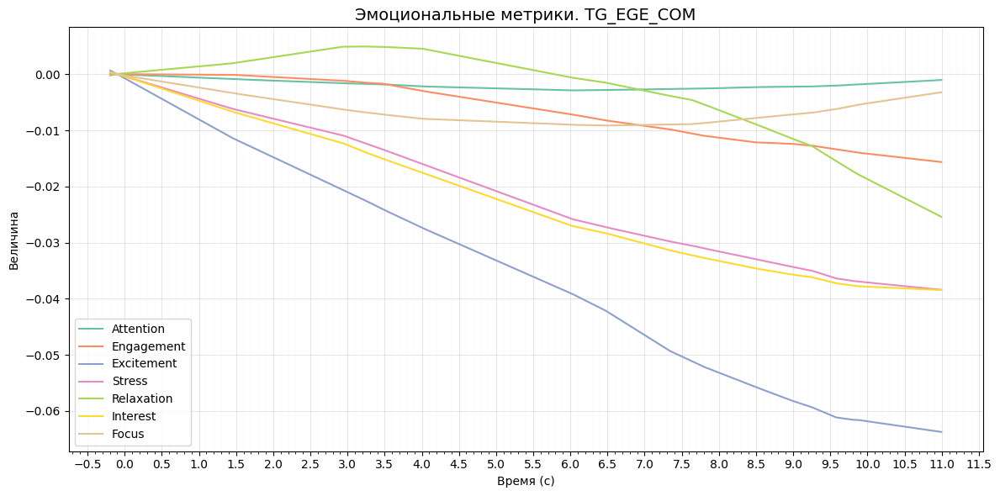

 83%|████████▎ | 20/24 [00:30<00:05,  1.48s/it]

TG_EGE_THR_1.png


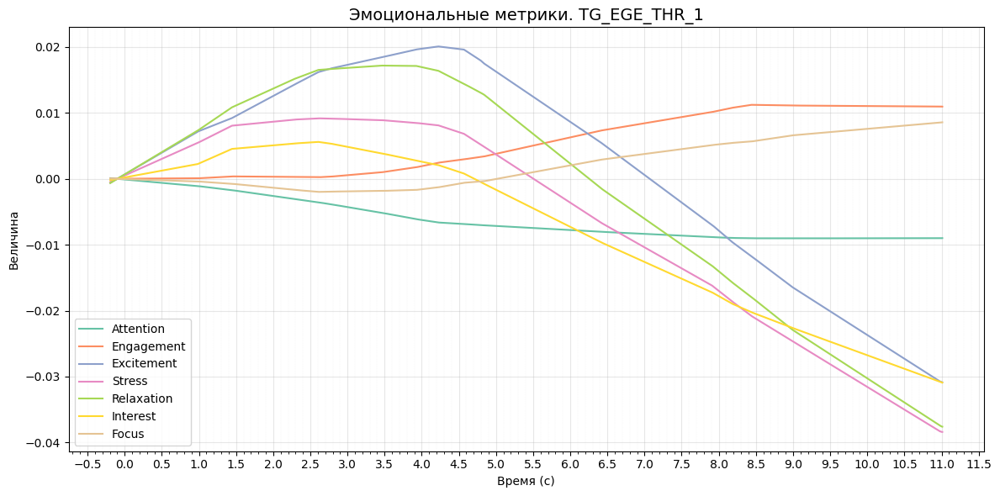

 88%|████████▊ | 21/24 [00:32<00:04,  1.59s/it]

TG_EGE_THR_2.png


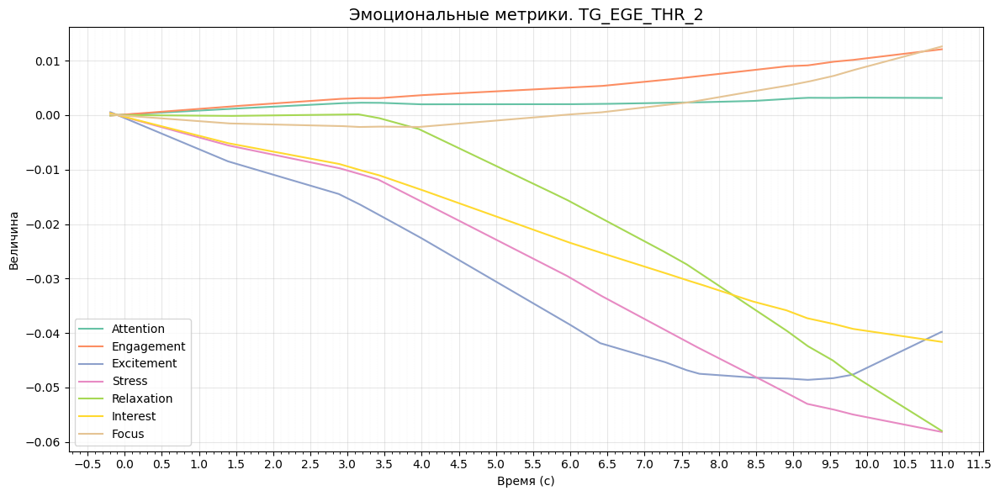

 92%|█████████▏| 22/24 [00:33<00:03,  1.55s/it]

VK_EGE_INFO.png


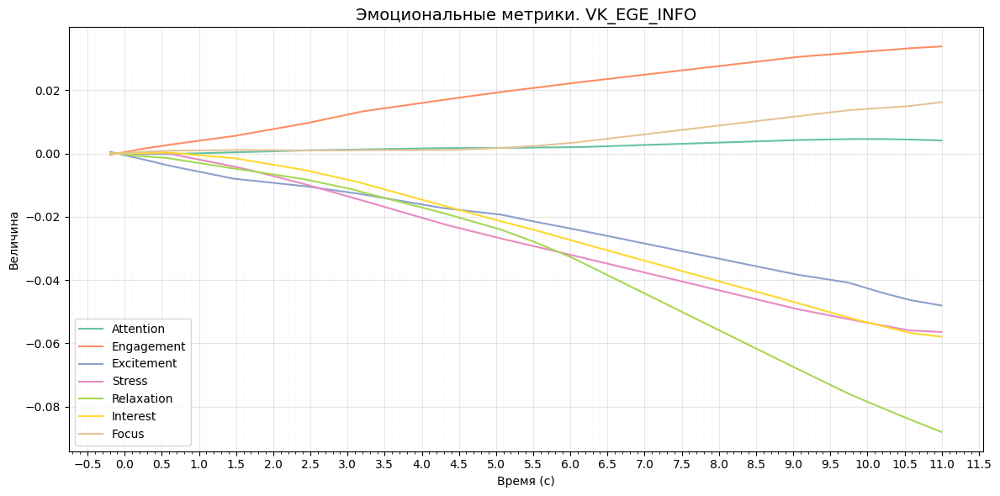

 96%|█████████▌| 23/24 [00:35<00:01,  1.53s/it]

VK_EGE_COM.png


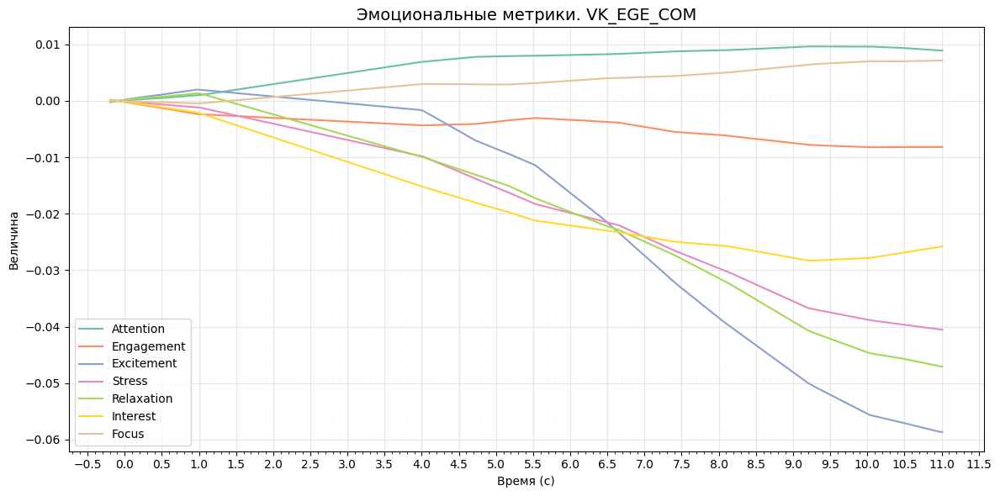

100%|██████████| 24/24 [00:37<00:00,  1.54s/it]


In [43]:
for stimulus_name in tqdm.tqdm(stimulus_emotion_data):
    average_emotions = interpolate_dataframes(stimulus_emotion_data[stimulus_name])
    plot_and_save_emotions(average_emotions, emotions_folder, stimulus_name, emotion_columns)

## Задание *

In [44]:
women_erp_folder = 'women_erp_images'
women_emotions_folder = 'women_emotions_images'
men_erp_folder = 'man_erp_images'
men_emotions_folder = 'man_emotions_images'
create_directory_if_not_exists(women_erp_folder)
create_directory_if_not_exists(women_emotions_folder)
create_directory_if_not_exists(men_erp_folder)
create_directory_if_not_exists(men_emotions_folder)

# Здесь индексы записаны с единицы (как в условии), для лучшей читаемости
man_idices = [2, 3, 4, 5, 6, 8, 10, 14, 17] # Пилоту соответсвует индекс 17
woman_idices = [1, 7, 9, 11, 12, 13, 15, 16]

In [ ]:
for stimulus_name in tqdm.tqdm(stimulus_emotion_data):
    women_eeg_data = [stimulus_eeg_data[stimulus_name][index - 1] for index in woman_idices]
    men_eeg_data = [stimulus_eeg_data[stimulus_name][index - 1] for index in man_idices]
    women_emotion_data = [stimulus_emotion_data[stimulus_name][index - 1] for index in woman_idices]
    men_emotion_data = [stimulus_emotion_data[stimulus_name][index - 1] for index in man_idices]
    
    women_erp = average_dataframes(women_eeg_data)
    plot_and_save_erp(women_erp, women_erp_folder, "Женщины "+ stimulus_name, montage, EEG_cols)
    men_erp = average_dataframes(men_eeg_data)
    plot_and_save_erp(men_erp, men_erp_folder, "Мужчины "+  stimulus_name, montage, EEG_cols)

    women_average_emotions = interpolate_dataframes(women_emotion_data)
    plot_and_save_emotions(women_average_emotions, women_emotions_folder, "Женщины "+ stimulus_name, emotion_columns)
    men_average_emotions = interpolate_dataframes(men_emotion_data)
    plot_and_save_emotions(men_average_emotions, men_emotions_folder, "Мужчины "+ stimulus_name, emotion_columns)
    